# Deep Convolutional WGANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

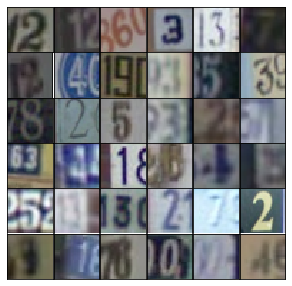

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)): # tanh
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    input_gen = generator(input_z, output_dim, alpha=alpha)
    Qlogits = discriminator(input_real, alpha=alpha)
    gQlogits = discriminator(input_gen, alpha=alpha, reuse=True)

    #     d_loss_real = tf.reduce_mean(
    #         tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    #     d_loss_fake = tf.reduce_mean(
    #         tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    #     g_loss = tf.reduce_mean(
    #         tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    #     d_loss = d_loss_real + d_loss_fake
    
    d_loss = tf.reduce_mean(tf.square(Qlogits - gQlogits))
    g_loss = -tf.reduce_mean(gQlogits)

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z, real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [16]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))
                
                if len(x) != batch_size:
                    print(batch_z.shape, x.shape)
                    
                else:
                    # Run optimizers
                    dloss, _ = sess.run([net.d_loss, net.d_opt], feed_dict={net.input_real: x, net.input_z: batch_z})
                    gloss, _ = sess.run([net.g_loss, net.g_opt], feed_dict={net.input_real: x, net.input_z: batch_z})

                    steps += 1
                    if steps % print_every == 0:
                        # # At the end of each epoch, get the losses and print them out
                        # train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                        # train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                        print("Epoch {}/{}...".format(e+1, epochs),
                              "Discriminator Loss: {:.4f}...".format(dloss),
                              "Generator Loss: {:.4f}".format(gloss))
                        # Save losses to view after training
                        losses.append((dloss, gloss))

                    if steps % show_every == 0:
                        gen_samples = sess.run(
                                       generator(net.input_z, 3, reuse=True, training=False),
                                       feed_dict={net.input_z: sample_z})
                        samples.append(gen_samples)
                        _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                        plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

        with open('samples.pkl', 'wb') as f:
            pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [17]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 100
alpha = 0.2
beta1 = 0.5

tf.reset_default_graph()

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

dataset = Dataset(trainset, testset)

Epoch 1/100... Discriminator Loss: 1.1954... Generator Loss: -0.3840
Epoch 1/100... Discriminator Loss: 3.7348... Generator Loss: -0.8101
Epoch 1/100... Discriminator Loss: 3.9746... Generator Loss: -7.2580
Epoch 1/100... Discriminator Loss: 3.2859... Generator Loss: -2.2974
Epoch 1/100... Discriminator Loss: 0.4604... Generator Loss: -3.5641
Epoch 1/100... Discriminator Loss: 0.4459... Generator Loss: -5.2709
Epoch 1/100... Discriminator Loss: 1.7900... Generator Loss: -4.1052
Epoch 1/100... Discriminator Loss: 0.3051... Generator Loss: -6.3046
Epoch 1/100... Discriminator Loss: 1.1327... Generator Loss: -6.7066
Epoch 1/100... Discriminator Loss: 0.7483... Generator Loss: -6.0303


/home/arasdar/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:1324: MatplotlibDeprecationWarning: 
box-forced
  "2.2", "box-forced", obj_type="keyword argument")


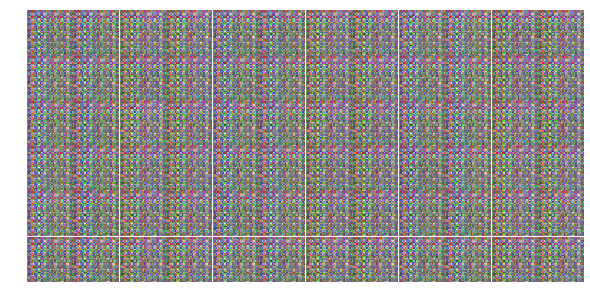

Epoch 1/100... Discriminator Loss: 0.9862... Generator Loss: -6.9470
Epoch 1/100... Discriminator Loss: 15.5600... Generator Loss: -4.3978
Epoch 1/100... Discriminator Loss: 0.1745... Generator Loss: -7.6953
Epoch 1/100... Discriminator Loss: 0.6438... Generator Loss: -5.6169
Epoch 1/100... Discriminator Loss: 0.2869... Generator Loss: -5.5136
Epoch 1/100... Discriminator Loss: 0.3310... Generator Loss: -7.0036
Epoch 1/100... Discriminator Loss: 0.5452... Generator Loss: -7.8475
Epoch 1/100... Discriminator Loss: 0.3208... Generator Loss: -7.0022
Epoch 1/100... Discriminator Loss: 1.2670... Generator Loss: -8.1304
Epoch 1/100... Discriminator Loss: 0.1381... Generator Loss: -7.8238


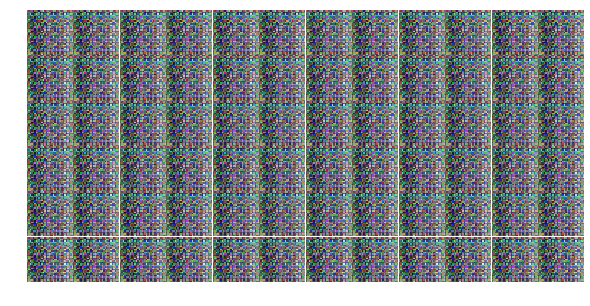

Epoch 1/100... Discriminator Loss: 0.3641... Generator Loss: -7.7280
Epoch 1/100... Discriminator Loss: 1.0571... Generator Loss: -5.8815
Epoch 1/100... Discriminator Loss: 0.2083... Generator Loss: -6.9149
Epoch 1/100... Discriminator Loss: 0.3021... Generator Loss: -7.6060
Epoch 1/100... Discriminator Loss: 0.2439... Generator Loss: -6.2408
Epoch 1/100... Discriminator Loss: 0.1618... Generator Loss: -6.1405
Epoch 1/100... Discriminator Loss: 0.1283... Generator Loss: -7.3259
Epoch 1/100... Discriminator Loss: 1.8930... Generator Loss: -7.4736
Epoch 1/100... Discriminator Loss: 0.4794... Generator Loss: -6.0661
Epoch 1/100... Discriminator Loss: 0.4258... Generator Loss: -6.6769


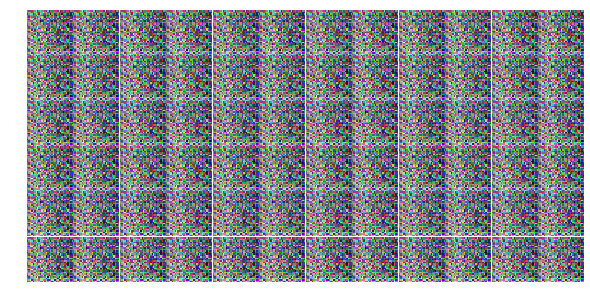

Epoch 1/100... Discriminator Loss: 0.1179... Generator Loss: -6.6911
Epoch 1/100... Discriminator Loss: 0.7727... Generator Loss: -6.3579
Epoch 1/100... Discriminator Loss: 0.2727... Generator Loss: -6.7262
Epoch 1/100... Discriminator Loss: 0.6667... Generator Loss: -5.7393
Epoch 1/100... Discriminator Loss: 0.3021... Generator Loss: -7.1431
Epoch 1/100... Discriminator Loss: 0.9537... Generator Loss: -7.6230
Epoch 1/100... Discriminator Loss: 0.1581... Generator Loss: -6.8962
Epoch 1/100... Discriminator Loss: 0.8476... Generator Loss: -5.7556
Epoch 1/100... Discriminator Loss: 0.6612... Generator Loss: -6.7993
Epoch 1/100... Discriminator Loss: 0.0965... Generator Loss: -6.5377


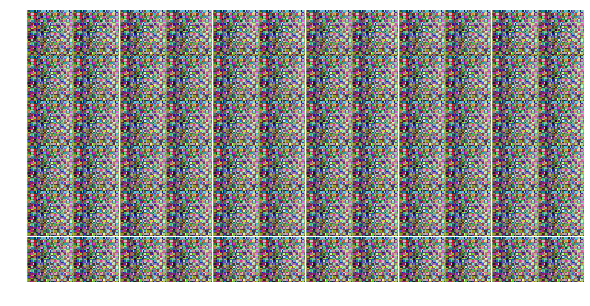

Epoch 1/100... Discriminator Loss: 0.6666... Generator Loss: -7.4809
Epoch 1/100... Discriminator Loss: 0.1266... Generator Loss: -6.9664
Epoch 1/100... Discriminator Loss: 1.1852... Generator Loss: -7.0826
Epoch 1/100... Discriminator Loss: 1.2673... Generator Loss: -7.6406
Epoch 1/100... Discriminator Loss: 0.1055... Generator Loss: -7.3548
Epoch 1/100... Discriminator Loss: 0.2923... Generator Loss: -7.5521
Epoch 1/100... Discriminator Loss: 0.5032... Generator Loss: -7.9399
Epoch 1/100... Discriminator Loss: 0.4219... Generator Loss: -6.7153
Epoch 1/100... Discriminator Loss: 0.2698... Generator Loss: -7.5779
Epoch 1/100... Discriminator Loss: 0.2050... Generator Loss: -7.4401


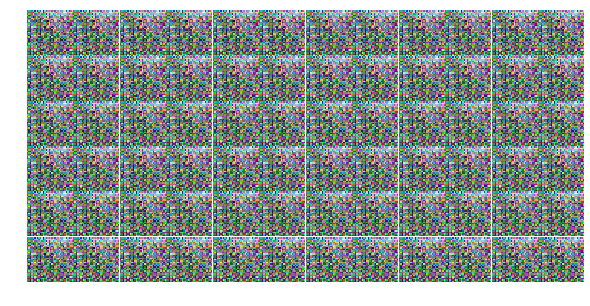

Epoch 1/100... Discriminator Loss: 0.1020... Generator Loss: -7.3270
Epoch 1/100... Discriminator Loss: 0.0443... Generator Loss: -7.1812
Epoch 1/100... Discriminator Loss: 0.0482... Generator Loss: -7.1103
Epoch 1/100... Discriminator Loss: 0.0747... Generator Loss: -7.1554
Epoch 1/100... Discriminator Loss: 0.0746... Generator Loss: -7.0393
Epoch 1/100... Discriminator Loss: 0.3035... Generator Loss: -6.7481
Epoch 1/100... Discriminator Loss: 0.4410... Generator Loss: -7.4590
(128, 100) (41, 32, 32, 3)
Epoch 2/100... Discriminator Loss: 0.1238... Generator Loss: -6.9642
Epoch 2/100... Discriminator Loss: 0.2726... Generator Loss: -7.2586
Epoch 2/100... Discriminator Loss: 0.0911... Generator Loss: -7.0359


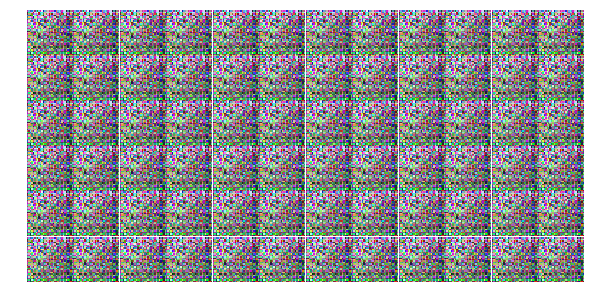

Epoch 2/100... Discriminator Loss: 0.0961... Generator Loss: -6.9972
Epoch 2/100... Discriminator Loss: 0.0728... Generator Loss: -6.8625
Epoch 2/100... Discriminator Loss: 0.0361... Generator Loss: -6.9407
Epoch 2/100... Discriminator Loss: 0.0526... Generator Loss: -7.0196
Epoch 2/100... Discriminator Loss: 0.2318... Generator Loss: -6.5846
Epoch 2/100... Discriminator Loss: 0.1928... Generator Loss: -7.0669
Epoch 2/100... Discriminator Loss: 0.1104... Generator Loss: -6.3048
Epoch 2/100... Discriminator Loss: 0.0367... Generator Loss: -7.2963
Epoch 2/100... Discriminator Loss: 0.7535... Generator Loss: -6.6832
Epoch 2/100... Discriminator Loss: 0.4317... Generator Loss: -6.0887


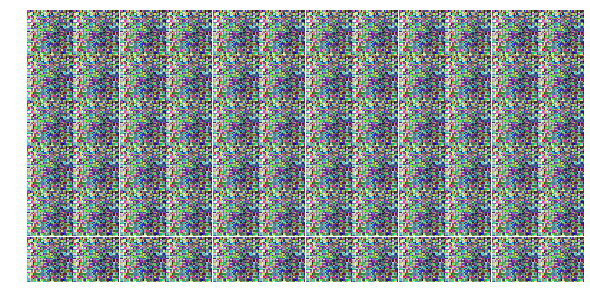

Epoch 2/100... Discriminator Loss: 0.1060... Generator Loss: -6.2746
Epoch 2/100... Discriminator Loss: 0.0328... Generator Loss: -6.5556
Epoch 2/100... Discriminator Loss: 0.0529... Generator Loss: -6.7566
Epoch 2/100... Discriminator Loss: 0.0543... Generator Loss: -6.7908
Epoch 2/100... Discriminator Loss: 0.0487... Generator Loss: -6.4836
Epoch 2/100... Discriminator Loss: 0.2548... Generator Loss: -7.2274
Epoch 2/100... Discriminator Loss: 0.0701... Generator Loss: -6.5475
Epoch 2/100... Discriminator Loss: 0.1595... Generator Loss: -6.3780
Epoch 2/100... Discriminator Loss: 0.0483... Generator Loss: -6.6214
Epoch 2/100... Discriminator Loss: 0.0330... Generator Loss: -6.9165


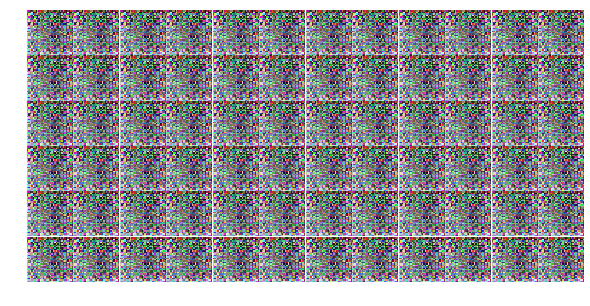

Epoch 2/100... Discriminator Loss: 0.0424... Generator Loss: -6.4130
Epoch 2/100... Discriminator Loss: 0.0324... Generator Loss: -6.8806
Epoch 2/100... Discriminator Loss: 0.4330... Generator Loss: -7.4607
Epoch 2/100... Discriminator Loss: 0.0548... Generator Loss: -7.0120
Epoch 2/100... Discriminator Loss: 0.4100... Generator Loss: -7.4373
Epoch 2/100... Discriminator Loss: 0.2700... Generator Loss: -6.8784
Epoch 2/100... Discriminator Loss: 0.1273... Generator Loss: -6.8057
Epoch 2/100... Discriminator Loss: 0.0899... Generator Loss: -6.7117
Epoch 2/100... Discriminator Loss: 0.0239... Generator Loss: -6.5659
Epoch 2/100... Discriminator Loss: 0.0337... Generator Loss: -6.5183


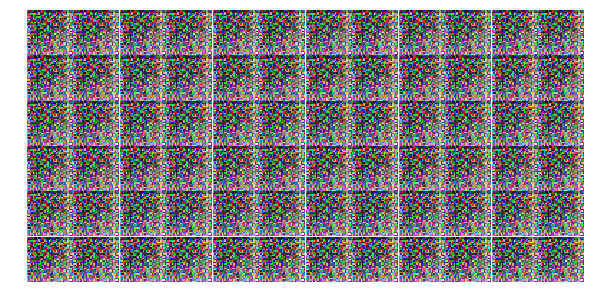

Epoch 2/100... Discriminator Loss: 0.1862... Generator Loss: -6.4607
Epoch 2/100... Discriminator Loss: 0.0527... Generator Loss: -6.7926
Epoch 2/100... Discriminator Loss: 0.0114... Generator Loss: -6.9950
Epoch 2/100... Discriminator Loss: 0.1543... Generator Loss: -6.9088
Epoch 2/100... Discriminator Loss: 0.0829... Generator Loss: -6.2228
Epoch 2/100... Discriminator Loss: 0.0568... Generator Loss: -6.2113
Epoch 2/100... Discriminator Loss: 0.1975... Generator Loss: -6.7179
Epoch 2/100... Discriminator Loss: 0.1868... Generator Loss: -6.4384
Epoch 2/100... Discriminator Loss: 0.2359... Generator Loss: -5.7722
Epoch 2/100... Discriminator Loss: 0.3365... Generator Loss: -6.0223


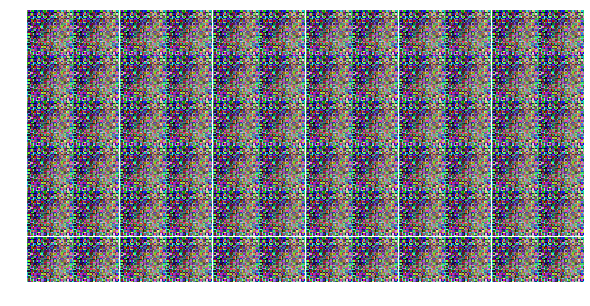

Epoch 2/100... Discriminator Loss: 0.1974... Generator Loss: -6.9206
Epoch 2/100... Discriminator Loss: 0.1096... Generator Loss: -6.3719
Epoch 2/100... Discriminator Loss: 0.0390... Generator Loss: -6.6633
Epoch 2/100... Discriminator Loss: 0.0247... Generator Loss: -6.7302
Epoch 2/100... Discriminator Loss: 0.0499... Generator Loss: -6.3768
Epoch 2/100... Discriminator Loss: 0.3391... Generator Loss: -6.2818
Epoch 2/100... Discriminator Loss: 0.0561... Generator Loss: -6.6795
Epoch 2/100... Discriminator Loss: 0.0643... Generator Loss: -6.2426
Epoch 2/100... Discriminator Loss: 0.0264... Generator Loss: -6.1883
Epoch 2/100... Discriminator Loss: 0.1165... Generator Loss: -6.3409


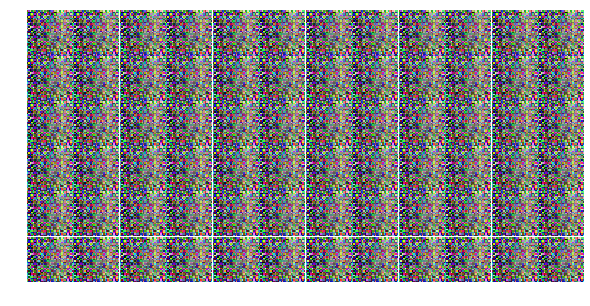

Epoch 2/100... Discriminator Loss: 0.0527... Generator Loss: -6.4330
Epoch 2/100... Discriminator Loss: 0.0415... Generator Loss: -6.5218
Epoch 2/100... Discriminator Loss: 0.0560... Generator Loss: -6.1308
Epoch 2/100... Discriminator Loss: 0.1380... Generator Loss: -6.6598
(128, 100) (41, 32, 32, 3)
Epoch 3/100... Discriminator Loss: 0.0328... Generator Loss: -6.3141
Epoch 3/100... Discriminator Loss: 0.0831... Generator Loss: -6.3678
Epoch 3/100... Discriminator Loss: 0.1374... Generator Loss: -6.0579
Epoch 3/100... Discriminator Loss: 0.1538... Generator Loss: -5.8443
Epoch 3/100... Discriminator Loss: 0.0616... Generator Loss: -5.8997
Epoch 3/100... Discriminator Loss: 0.1308... Generator Loss: -6.0360


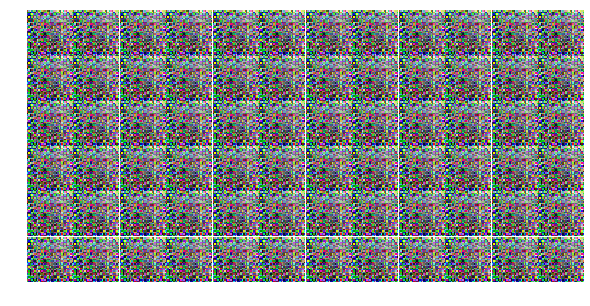

Epoch 3/100... Discriminator Loss: 0.0345... Generator Loss: -5.9786
Epoch 3/100... Discriminator Loss: 0.0866... Generator Loss: -6.0444
Epoch 3/100... Discriminator Loss: 0.0082... Generator Loss: -6.1236
Epoch 3/100... Discriminator Loss: 0.0081... Generator Loss: -6.1665
Epoch 3/100... Discriminator Loss: 0.0295... Generator Loss: -6.0034
Epoch 3/100... Discriminator Loss: 0.1838... Generator Loss: -5.7742
Epoch 3/100... Discriminator Loss: 0.0604... Generator Loss: -6.1809
Epoch 3/100... Discriminator Loss: 0.0780... Generator Loss: -6.2535
Epoch 3/100... Discriminator Loss: 0.0485... Generator Loss: -6.2977
Epoch 3/100... Discriminator Loss: 0.3363... Generator Loss: -5.8845


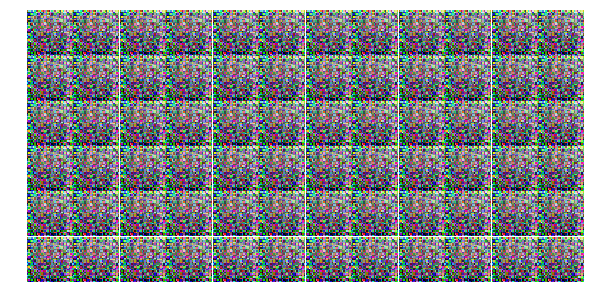

Epoch 3/100... Discriminator Loss: 0.0421... Generator Loss: -6.0376
Epoch 3/100... Discriminator Loss: 1.0758... Generator Loss: -6.4886
Epoch 3/100... Discriminator Loss: 0.0481... Generator Loss: -5.9837
Epoch 3/100... Discriminator Loss: 0.0919... Generator Loss: -6.3210
Epoch 3/100... Discriminator Loss: 0.0197... Generator Loss: -5.9403
Epoch 3/100... Discriminator Loss: 0.0083... Generator Loss: -6.2376
Epoch 3/100... Discriminator Loss: 0.1934... Generator Loss: -5.6842
Epoch 3/100... Discriminator Loss: 0.0065... Generator Loss: -6.0239
Epoch 3/100... Discriminator Loss: 0.0249... Generator Loss: -5.9522
Epoch 3/100... Discriminator Loss: 0.0158... Generator Loss: -5.9233


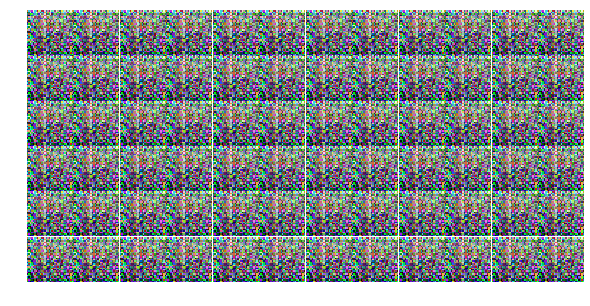

Epoch 3/100... Discriminator Loss: 0.0879... Generator Loss: -5.8109
Epoch 3/100... Discriminator Loss: 0.1275... Generator Loss: -6.0367
Epoch 3/100... Discriminator Loss: 0.1373... Generator Loss: -6.0612
Epoch 3/100... Discriminator Loss: 0.2269... Generator Loss: -5.7249
Epoch 3/100... Discriminator Loss: 0.3528... Generator Loss: -5.6296
Epoch 3/100... Discriminator Loss: 0.0388... Generator Loss: -5.7620
Epoch 3/100... Discriminator Loss: 0.0438... Generator Loss: -5.9145
Epoch 3/100... Discriminator Loss: 0.0487... Generator Loss: -5.9920
Epoch 3/100... Discriminator Loss: 0.1151... Generator Loss: -5.4064
Epoch 3/100... Discriminator Loss: 0.0393... Generator Loss: -5.9264


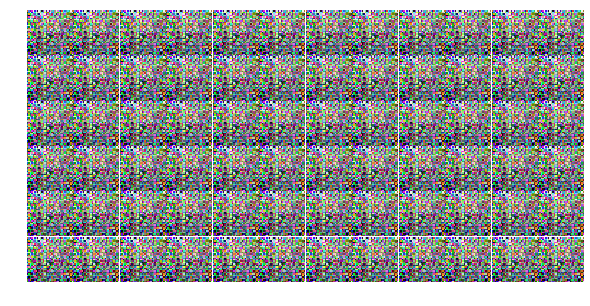

Epoch 3/100... Discriminator Loss: 0.0464... Generator Loss: -5.6187
Epoch 3/100... Discriminator Loss: 0.0213... Generator Loss: -5.9690
Epoch 3/100... Discriminator Loss: 0.0498... Generator Loss: -5.7903
Epoch 3/100... Discriminator Loss: 0.0180... Generator Loss: -5.7557
Epoch 3/100... Discriminator Loss: 0.0090... Generator Loss: -5.8898
Epoch 3/100... Discriminator Loss: 0.0824... Generator Loss: -6.1490
Epoch 3/100... Discriminator Loss: 0.0487... Generator Loss: -5.5137
Epoch 3/100... Discriminator Loss: 0.0054... Generator Loss: -6.0896
Epoch 3/100... Discriminator Loss: 0.1317... Generator Loss: -6.3809
Epoch 3/100... Discriminator Loss: 0.0343... Generator Loss: -5.7614


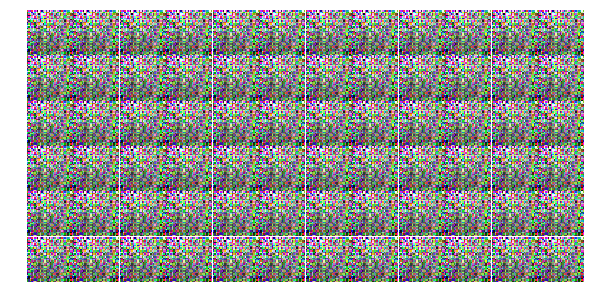

Epoch 3/100... Discriminator Loss: 0.0399... Generator Loss: -5.7695
Epoch 3/100... Discriminator Loss: 0.0224... Generator Loss: -5.8397
Epoch 3/100... Discriminator Loss: 0.0143... Generator Loss: -5.5136
Epoch 3/100... Discriminator Loss: 0.0055... Generator Loss: -5.9126
Epoch 3/100... Discriminator Loss: 0.0366... Generator Loss: -5.7494
Epoch 3/100... Discriminator Loss: 0.0406... Generator Loss: -5.9797
Epoch 3/100... Discriminator Loss: 0.0355... Generator Loss: -5.8361
Epoch 3/100... Discriminator Loss: 0.0541... Generator Loss: -5.6783
Epoch 3/100... Discriminator Loss: 0.0369... Generator Loss: -5.5516
Epoch 3/100... Discriminator Loss: 0.0325... Generator Loss: -6.0008


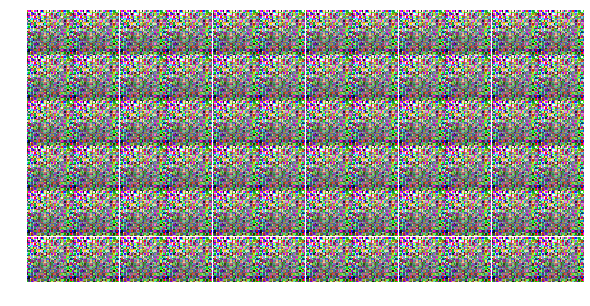

Epoch 3/100... Discriminator Loss: 0.0393... Generator Loss: -5.5420
(128, 100) (41, 32, 32, 3)
Epoch 4/100... Discriminator Loss: 0.1189... Generator Loss: -5.4881
Epoch 4/100... Discriminator Loss: 0.0202... Generator Loss: -5.7771
Epoch 4/100... Discriminator Loss: 0.0583... Generator Loss: -5.7681
Epoch 4/100... Discriminator Loss: 0.0115... Generator Loss: -5.6860
Epoch 4/100... Discriminator Loss: 0.0053... Generator Loss: -5.6677
Epoch 4/100... Discriminator Loss: 0.0329... Generator Loss: -5.5943
Epoch 4/100... Discriminator Loss: 0.0973... Generator Loss: -5.8996
Epoch 4/100... Discriminator Loss: 0.0462... Generator Loss: -5.7655
Epoch 4/100... Discriminator Loss: 0.0365... Generator Loss: -5.8308


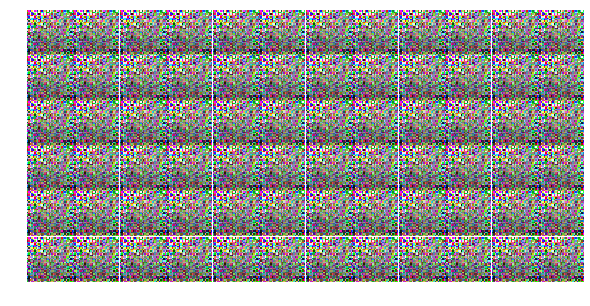

Epoch 4/100... Discriminator Loss: 0.0276... Generator Loss: -5.6028
Epoch 4/100... Discriminator Loss: 0.0711... Generator Loss: -5.9930
Epoch 4/100... Discriminator Loss: 0.0134... Generator Loss: -5.4996
Epoch 4/100... Discriminator Loss: 0.0416... Generator Loss: -5.4766
Epoch 4/100... Discriminator Loss: 0.0823... Generator Loss: -5.4096
Epoch 4/100... Discriminator Loss: 0.0152... Generator Loss: -5.5345
Epoch 4/100... Discriminator Loss: 0.0057... Generator Loss: -5.6069
Epoch 4/100... Discriminator Loss: 0.1526... Generator Loss: -5.2825
Epoch 4/100... Discriminator Loss: 0.0135... Generator Loss: -5.6007
Epoch 4/100... Discriminator Loss: 0.0135... Generator Loss: -5.5333


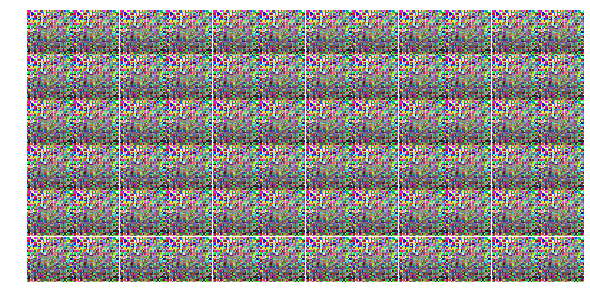

Epoch 4/100... Discriminator Loss: 0.0046... Generator Loss: -5.4657
Epoch 4/100... Discriminator Loss: 0.0375... Generator Loss: -5.5097
Epoch 4/100... Discriminator Loss: 0.0995... Generator Loss: -5.2861
Epoch 4/100... Discriminator Loss: 0.0302... Generator Loss: -5.5554
Epoch 4/100... Discriminator Loss: 0.0050... Generator Loss: -5.5752
Epoch 4/100... Discriminator Loss: 0.0074... Generator Loss: -5.4973
Epoch 4/100... Discriminator Loss: 0.0306... Generator Loss: -5.5433
Epoch 4/100... Discriminator Loss: 0.0389... Generator Loss: -5.5494
Epoch 4/100... Discriminator Loss: 0.0423... Generator Loss: -5.3266
Epoch 4/100... Discriminator Loss: 0.0176... Generator Loss: -5.5516


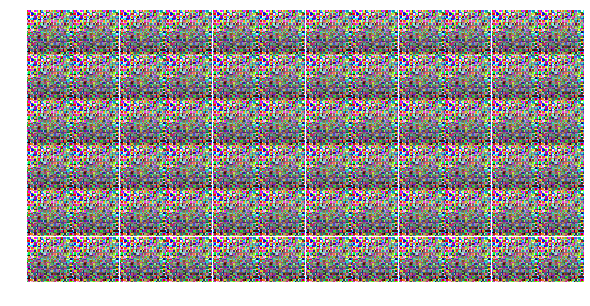

Epoch 4/100... Discriminator Loss: 0.0115... Generator Loss: -5.2726
Epoch 4/100... Discriminator Loss: 0.0211... Generator Loss: -5.2944
Epoch 4/100... Discriminator Loss: 0.1074... Generator Loss: -5.3682
Epoch 4/100... Discriminator Loss: 0.0191... Generator Loss: -5.2905
Epoch 4/100... Discriminator Loss: 0.0119... Generator Loss: -5.3873
Epoch 4/100... Discriminator Loss: 0.0072... Generator Loss: -5.4556
Epoch 4/100... Discriminator Loss: 0.0041... Generator Loss: -5.5070
Epoch 4/100... Discriminator Loss: 0.0038... Generator Loss: -5.4896
Epoch 4/100... Discriminator Loss: 0.0139... Generator Loss: -5.2315
Epoch 4/100... Discriminator Loss: 0.0338... Generator Loss: -5.1910


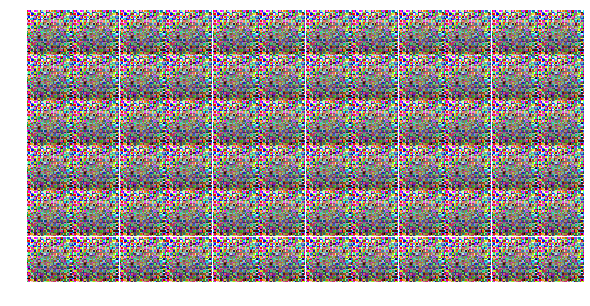

Epoch 4/100... Discriminator Loss: 0.0178... Generator Loss: -5.2660
Epoch 4/100... Discriminator Loss: 0.0128... Generator Loss: -5.3385
Epoch 4/100... Discriminator Loss: 0.0224... Generator Loss: -5.4951
Epoch 4/100... Discriminator Loss: 0.0419... Generator Loss: -5.2220
Epoch 4/100... Discriminator Loss: 0.0109... Generator Loss: -5.2742
Epoch 4/100... Discriminator Loss: 0.0246... Generator Loss: -5.2190
Epoch 4/100... Discriminator Loss: 0.0059... Generator Loss: -5.2744
Epoch 4/100... Discriminator Loss: 0.0048... Generator Loss: -5.2816
Epoch 4/100... Discriminator Loss: 0.0396... Generator Loss: -5.4690
Epoch 4/100... Discriminator Loss: 0.1196... Generator Loss: -5.4386


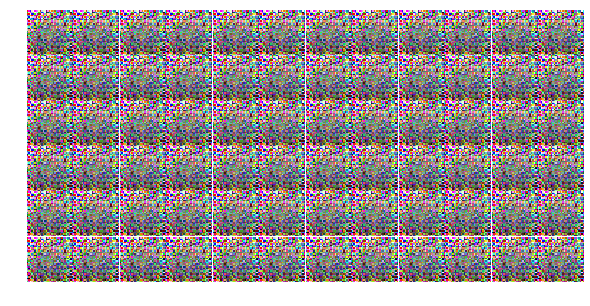

Epoch 4/100... Discriminator Loss: 0.0094... Generator Loss: -5.1050
Epoch 4/100... Discriminator Loss: 0.0088... Generator Loss: -5.3110
Epoch 4/100... Discriminator Loss: 0.0261... Generator Loss: -5.2877
Epoch 4/100... Discriminator Loss: 0.0144... Generator Loss: -5.1753
Epoch 4/100... Discriminator Loss: 0.0365... Generator Loss: -5.1526
Epoch 4/100... Discriminator Loss: 0.0052... Generator Loss: -5.1831
Epoch 4/100... Discriminator Loss: 0.0355... Generator Loss: -5.1672
Epoch 4/100... Discriminator Loss: 0.0670... Generator Loss: -5.4924
(128, 100) (41, 32, 32, 3)
Epoch 5/100... Discriminator Loss: 0.0268... Generator Loss: -5.1097
Epoch 5/100... Discriminator Loss: 0.0252... Generator Loss: -5.3065


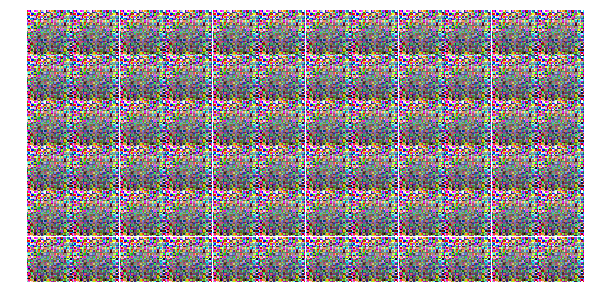

Epoch 5/100... Discriminator Loss: 0.0763... Generator Loss: -4.8689
Epoch 5/100... Discriminator Loss: 0.0115... Generator Loss: -5.1382
Epoch 5/100... Discriminator Loss: 0.0304... Generator Loss: -5.2117
Epoch 5/100... Discriminator Loss: 0.0364... Generator Loss: -5.2115
Epoch 5/100... Discriminator Loss: 0.0141... Generator Loss: -5.2578
Epoch 5/100... Discriminator Loss: 0.0200... Generator Loss: -5.2176
Epoch 5/100... Discriminator Loss: 0.0395... Generator Loss: -4.9288
Epoch 5/100... Discriminator Loss: 0.0171... Generator Loss: -5.1164
Epoch 5/100... Discriminator Loss: 0.0278... Generator Loss: -5.1111
Epoch 5/100... Discriminator Loss: 0.0334... Generator Loss: -5.1678


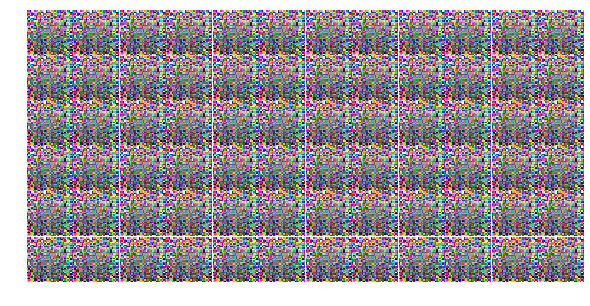

Epoch 5/100... Discriminator Loss: 0.0076... Generator Loss: -5.2732
Epoch 5/100... Discriminator Loss: 0.0200... Generator Loss: -5.0076
Epoch 5/100... Discriminator Loss: 0.0714... Generator Loss: -5.0507
Epoch 5/100... Discriminator Loss: 0.0810... Generator Loss: -4.8285
Epoch 5/100... Discriminator Loss: 0.0073... Generator Loss: -4.9366
Epoch 5/100... Discriminator Loss: 0.0204... Generator Loss: -4.8897
Epoch 5/100... Discriminator Loss: 0.0182... Generator Loss: -5.0342
Epoch 5/100... Discriminator Loss: 0.0145... Generator Loss: -5.0356
Epoch 5/100... Discriminator Loss: 0.0363... Generator Loss: -4.9340
Epoch 5/100... Discriminator Loss: 0.0082... Generator Loss: -4.7917


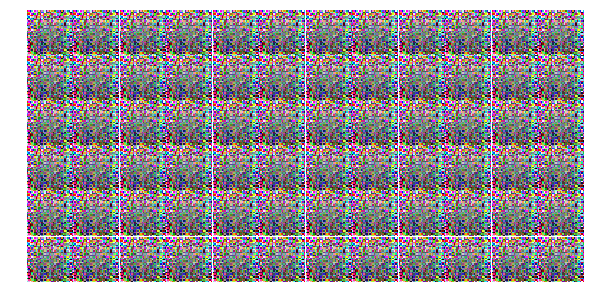

Epoch 5/100... Discriminator Loss: 0.0811... Generator Loss: -4.7312
Epoch 5/100... Discriminator Loss: 0.0043... Generator Loss: -4.9107
Epoch 5/100... Discriminator Loss: 0.1925... Generator Loss: -5.1865
Epoch 5/100... Discriminator Loss: 0.0807... Generator Loss: -4.8106
Epoch 5/100... Discriminator Loss: 0.0746... Generator Loss: -4.8249
Epoch 5/100... Discriminator Loss: 0.0397... Generator Loss: -5.1246
Epoch 5/100... Discriminator Loss: 0.0439... Generator Loss: -4.9519
Epoch 5/100... Discriminator Loss: 0.0238... Generator Loss: -4.9165
Epoch 5/100... Discriminator Loss: 0.0046... Generator Loss: -4.9318
Epoch 5/100... Discriminator Loss: 0.0345... Generator Loss: -5.1365


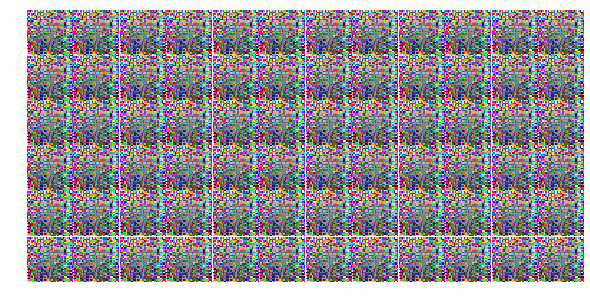

Epoch 5/100... Discriminator Loss: 0.1047... Generator Loss: -5.1992
Epoch 5/100... Discriminator Loss: 0.0032... Generator Loss: -5.0041
Epoch 5/100... Discriminator Loss: 0.0216... Generator Loss: -4.8632
Epoch 5/100... Discriminator Loss: 0.0202... Generator Loss: -4.7615
Epoch 5/100... Discriminator Loss: 0.0304... Generator Loss: -4.7978
Epoch 5/100... Discriminator Loss: 0.0224... Generator Loss: -4.9304
Epoch 5/100... Discriminator Loss: 0.0255... Generator Loss: -5.1546
Epoch 5/100... Discriminator Loss: 0.0137... Generator Loss: -4.9855
Epoch 5/100... Discriminator Loss: 0.0078... Generator Loss: -4.8558
Epoch 5/100... Discriminator Loss: 0.0299... Generator Loss: -4.7545


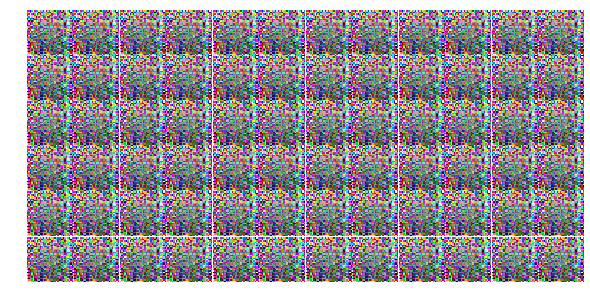

Epoch 5/100... Discriminator Loss: 0.0049... Generator Loss: -4.7585
Epoch 5/100... Discriminator Loss: 0.0043... Generator Loss: -4.7017
Epoch 5/100... Discriminator Loss: 0.0127... Generator Loss: -4.7774
Epoch 5/100... Discriminator Loss: 0.0101... Generator Loss: -4.6904
Epoch 5/100... Discriminator Loss: 0.0040... Generator Loss: -4.8545
Epoch 5/100... Discriminator Loss: 0.0197... Generator Loss: -4.7708
Epoch 5/100... Discriminator Loss: 0.0128... Generator Loss: -4.6872
Epoch 5/100... Discriminator Loss: 0.0124... Generator Loss: -4.8015
Epoch 5/100... Discriminator Loss: 0.0097... Generator Loss: -4.7612
Epoch 5/100... Discriminator Loss: 0.1103... Generator Loss: -4.9701


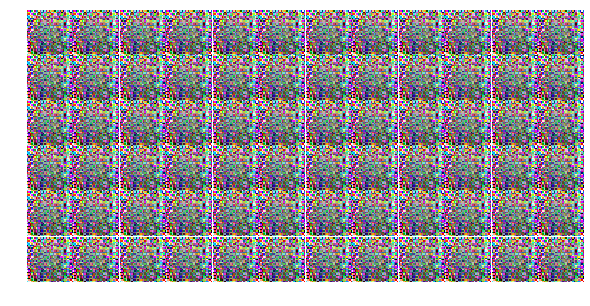

Epoch 5/100... Discriminator Loss: 0.0579... Generator Loss: -5.0060
Epoch 5/100... Discriminator Loss: 0.0318... Generator Loss: -4.6589
Epoch 5/100... Discriminator Loss: 0.0177... Generator Loss: -4.7670
Epoch 5/100... Discriminator Loss: 0.0131... Generator Loss: -4.6312
Epoch 5/100... Discriminator Loss: 0.0652... Generator Loss: -4.4662
Epoch 5/100... Discriminator Loss: 0.0165... Generator Loss: -4.7296
(128, 100) (41, 32, 32, 3)
Epoch 6/100... Discriminator Loss: 0.0110... Generator Loss: -4.7701
Epoch 6/100... Discriminator Loss: 0.0037... Generator Loss: -4.6726
Epoch 6/100... Discriminator Loss: 0.0572... Generator Loss: -4.8915
Epoch 6/100... Discriminator Loss: 0.0063... Generator Loss: -4.8740


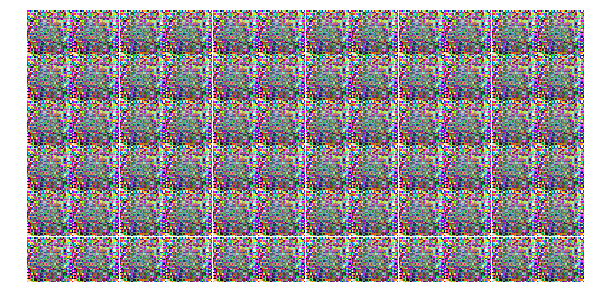

Epoch 6/100... Discriminator Loss: 0.0396... Generator Loss: -4.3985
Epoch 6/100... Discriminator Loss: 0.0077... Generator Loss: -4.6945
Epoch 6/100... Discriminator Loss: 0.0146... Generator Loss: -4.6648
Epoch 6/100... Discriminator Loss: 0.0071... Generator Loss: -4.5961
Epoch 6/100... Discriminator Loss: 0.0062... Generator Loss: -4.6006
Epoch 6/100... Discriminator Loss: 0.0845... Generator Loss: -4.2820
Epoch 6/100... Discriminator Loss: 0.0031... Generator Loss: -4.7041
Epoch 6/100... Discriminator Loss: 0.0891... Generator Loss: -4.3096
Epoch 6/100... Discriminator Loss: 0.0922... Generator Loss: -4.4334
Epoch 6/100... Discriminator Loss: 0.0507... Generator Loss: -4.2544


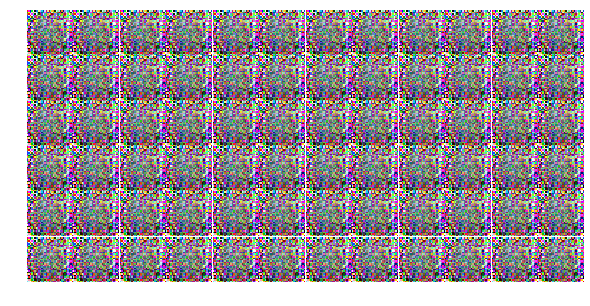

Epoch 6/100... Discriminator Loss: 0.0078... Generator Loss: -4.5977
Epoch 6/100... Discriminator Loss: 0.0127... Generator Loss: -4.5701
Epoch 6/100... Discriminator Loss: 0.1635... Generator Loss: -4.8790
Epoch 6/100... Discriminator Loss: 0.0135... Generator Loss: -4.6077
Epoch 6/100... Discriminator Loss: 0.0390... Generator Loss: -4.8308
Epoch 6/100... Discriminator Loss: 0.0599... Generator Loss: -4.9157
Epoch 6/100... Discriminator Loss: 0.0223... Generator Loss: -4.8250
Epoch 6/100... Discriminator Loss: 0.0624... Generator Loss: -4.3607
Epoch 6/100... Discriminator Loss: 0.0084... Generator Loss: -4.6226
Epoch 6/100... Discriminator Loss: 0.0273... Generator Loss: -4.8467


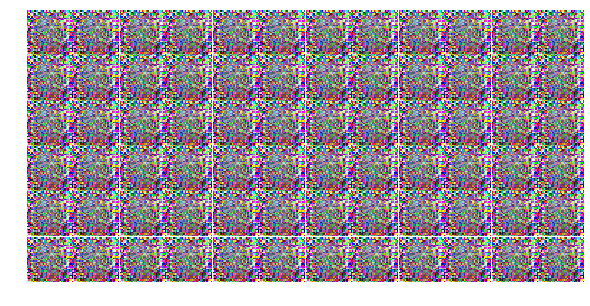

Epoch 6/100... Discriminator Loss: 0.0047... Generator Loss: -4.5689
Epoch 6/100... Discriminator Loss: 0.0415... Generator Loss: -4.6039
Epoch 6/100... Discriminator Loss: 0.0035... Generator Loss: -4.5992
Epoch 6/100... Discriminator Loss: 0.3212... Generator Loss: -4.9548
Epoch 6/100... Discriminator Loss: 0.0072... Generator Loss: -4.4184
Epoch 6/100... Discriminator Loss: 0.0047... Generator Loss: -4.5545
Epoch 6/100... Discriminator Loss: 0.0087... Generator Loss: -4.5375
Epoch 6/100... Discriminator Loss: 0.0035... Generator Loss: -4.6057
Epoch 6/100... Discriminator Loss: 0.0345... Generator Loss: -4.3647
Epoch 6/100... Discriminator Loss: 0.0037... Generator Loss: -4.4078


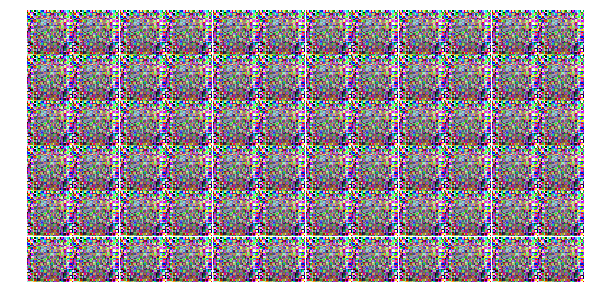

Epoch 6/100... Discriminator Loss: 0.0180... Generator Loss: -4.6110
Epoch 6/100... Discriminator Loss: 0.0138... Generator Loss: -4.4422
Epoch 6/100... Discriminator Loss: 0.0205... Generator Loss: -4.5240
Epoch 6/100... Discriminator Loss: 0.0235... Generator Loss: -4.3644
Epoch 6/100... Discriminator Loss: 0.0229... Generator Loss: -4.3477
Epoch 6/100... Discriminator Loss: 0.0394... Generator Loss: -4.4857
Epoch 6/100... Discriminator Loss: 0.0083... Generator Loss: -4.4524
Epoch 6/100... Discriminator Loss: 0.0025... Generator Loss: -4.4331
Epoch 6/100... Discriminator Loss: 0.0049... Generator Loss: -4.6146
Epoch 6/100... Discriminator Loss: 0.0046... Generator Loss: -4.4442


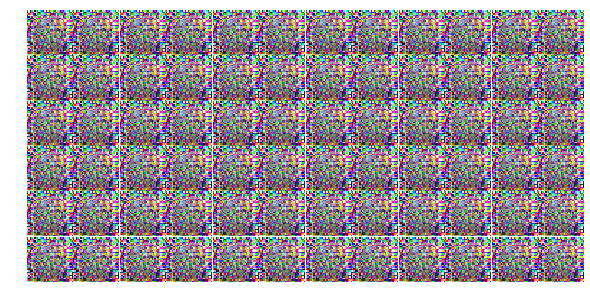

Epoch 6/100... Discriminator Loss: 0.0156... Generator Loss: -4.3172
Epoch 6/100... Discriminator Loss: 0.0067... Generator Loss: -4.3168
Epoch 6/100... Discriminator Loss: 0.0470... Generator Loss: -4.5801
Epoch 6/100... Discriminator Loss: 0.0029... Generator Loss: -4.3902
Epoch 6/100... Discriminator Loss: 0.0051... Generator Loss: -4.4295
Epoch 6/100... Discriminator Loss: 0.0234... Generator Loss: -4.2759
Epoch 6/100... Discriminator Loss: 0.0110... Generator Loss: -4.4741
Epoch 6/100... Discriminator Loss: 0.0120... Generator Loss: -4.3950
Epoch 6/100... Discriminator Loss: 0.0180... Generator Loss: -4.2234
Epoch 6/100... Discriminator Loss: 0.0074... Generator Loss: -4.3525


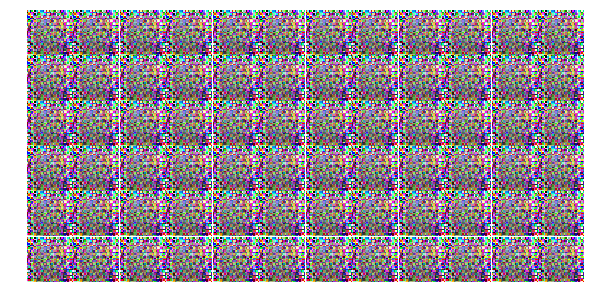

Epoch 6/100... Discriminator Loss: 0.0062... Generator Loss: -4.4227
Epoch 6/100... Discriminator Loss: 0.0841... Generator Loss: -4.0254
Epoch 6/100... Discriminator Loss: 0.0180... Generator Loss: -4.4276
(128, 100) (41, 32, 32, 3)
Epoch 7/100... Discriminator Loss: 0.0151... Generator Loss: -4.4889
Epoch 7/100... Discriminator Loss: 0.0208... Generator Loss: -4.3831
Epoch 7/100... Discriminator Loss: 0.0060... Generator Loss: -4.3127
Epoch 7/100... Discriminator Loss: 0.0416... Generator Loss: -4.1430
Epoch 7/100... Discriminator Loss: 0.0131... Generator Loss: -4.2448
Epoch 7/100... Discriminator Loss: 0.0085... Generator Loss: -4.2560
Epoch 7/100... Discriminator Loss: 0.0032... Generator Loss: -4.2419


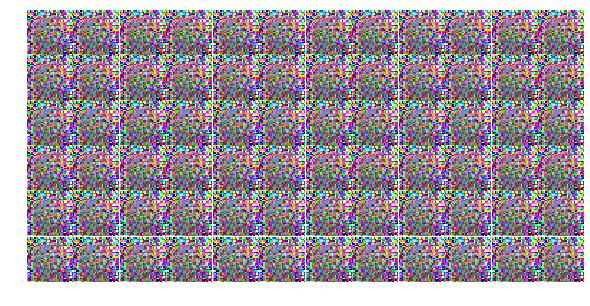

Epoch 7/100... Discriminator Loss: 0.0030... Generator Loss: -4.2023
Epoch 7/100... Discriminator Loss: 0.0316... Generator Loss: -4.3329
Epoch 7/100... Discriminator Loss: 0.0134... Generator Loss: -4.1175
Epoch 7/100... Discriminator Loss: 0.0129... Generator Loss: -4.2767
Epoch 7/100... Discriminator Loss: 0.0132... Generator Loss: -4.1681
Epoch 7/100... Discriminator Loss: 0.0079... Generator Loss: -4.0316
Epoch 7/100... Discriminator Loss: 0.0030... Generator Loss: -4.0933
Epoch 7/100... Discriminator Loss: 0.0026... Generator Loss: -4.3009
Epoch 7/100... Discriminator Loss: 0.0172... Generator Loss: -4.1190
Epoch 7/100... Discriminator Loss: 0.0170... Generator Loss: -4.3643


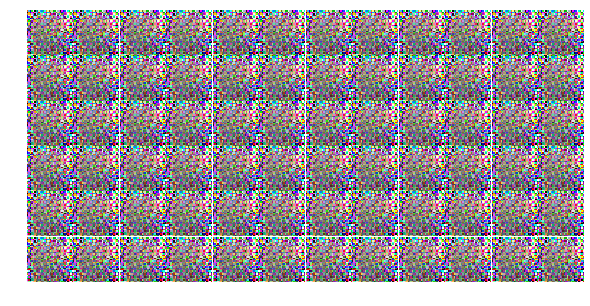

Epoch 7/100... Discriminator Loss: 0.1324... Generator Loss: -4.3884
Epoch 7/100... Discriminator Loss: 0.0043... Generator Loss: -4.2588
Epoch 7/100... Discriminator Loss: 0.0025... Generator Loss: -4.1996
Epoch 7/100... Discriminator Loss: 0.0171... Generator Loss: -4.1174
Epoch 7/100... Discriminator Loss: 0.0175... Generator Loss: -4.0984
Epoch 7/100... Discriminator Loss: 0.0114... Generator Loss: -4.1362
Epoch 7/100... Discriminator Loss: 0.0070... Generator Loss: -4.0461
Epoch 7/100... Discriminator Loss: 0.0019... Generator Loss: -4.1553
Epoch 7/100... Discriminator Loss: 0.0869... Generator Loss: -4.4244
Epoch 7/100... Discriminator Loss: 0.0016... Generator Loss: -4.1495


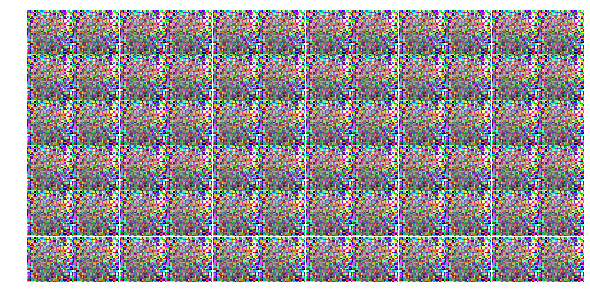

Epoch 7/100... Discriminator Loss: 0.0561... Generator Loss: -4.4612
Epoch 7/100... Discriminator Loss: 0.0582... Generator Loss: -4.2799
Epoch 7/100... Discriminator Loss: 0.0203... Generator Loss: -4.1049
Epoch 7/100... Discriminator Loss: 0.0101... Generator Loss: -4.1080
Epoch 7/100... Discriminator Loss: 0.0380... Generator Loss: -3.9215
Epoch 7/100... Discriminator Loss: 0.0026... Generator Loss: -4.0852
Epoch 7/100... Discriminator Loss: 0.0088... Generator Loss: -4.2025
Epoch 7/100... Discriminator Loss: 0.1397... Generator Loss: -3.9106
Epoch 7/100... Discriminator Loss: 0.0174... Generator Loss: -4.2126
Epoch 7/100... Discriminator Loss: 0.0166... Generator Loss: -4.2067


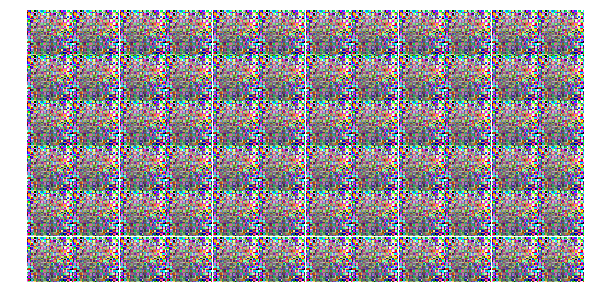

Epoch 7/100... Discriminator Loss: 0.0073... Generator Loss: -4.0024
Epoch 7/100... Discriminator Loss: 0.0472... Generator Loss: -4.2198
Epoch 7/100... Discriminator Loss: 0.0111... Generator Loss: -4.2330
Epoch 7/100... Discriminator Loss: 0.0027... Generator Loss: -4.0721
Epoch 7/100... Discriminator Loss: 0.0111... Generator Loss: -3.9089
Epoch 7/100... Discriminator Loss: 0.0251... Generator Loss: -3.8056
Epoch 7/100... Discriminator Loss: 0.0024... Generator Loss: -4.0965
Epoch 7/100... Discriminator Loss: 0.0034... Generator Loss: -3.9240
Epoch 7/100... Discriminator Loss: 0.0045... Generator Loss: -4.0176
Epoch 7/100... Discriminator Loss: 0.0056... Generator Loss: -4.1449


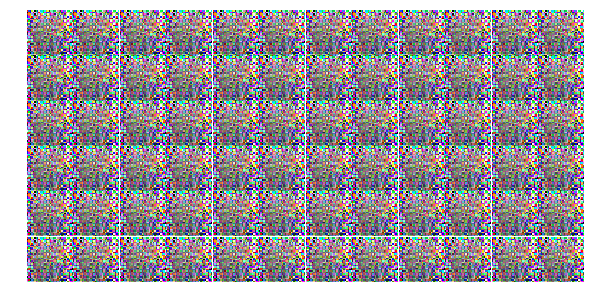

Epoch 7/100... Discriminator Loss: 0.0055... Generator Loss: -3.9730
Epoch 7/100... Discriminator Loss: 0.0071... Generator Loss: -3.8602
Epoch 7/100... Discriminator Loss: 0.0030... Generator Loss: -3.8503
Epoch 7/100... Discriminator Loss: 0.0188... Generator Loss: -3.7822
Epoch 7/100... Discriminator Loss: 0.0236... Generator Loss: -3.8846
Epoch 7/100... Discriminator Loss: 0.0080... Generator Loss: -3.8830
Epoch 7/100... Discriminator Loss: 0.0495... Generator Loss: -3.7555
Epoch 7/100... Discriminator Loss: 0.0081... Generator Loss: -3.9254
Epoch 7/100... Discriminator Loss: 0.0030... Generator Loss: -3.8554
Epoch 7/100... Discriminator Loss: 0.0058... Generator Loss: -3.8385


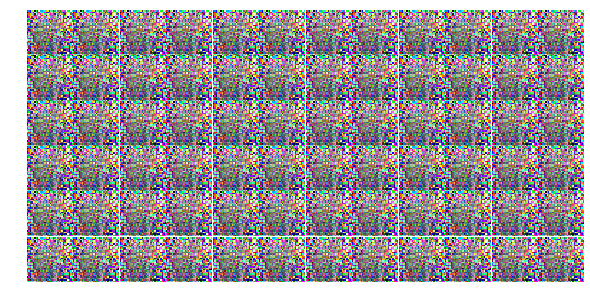

(128, 100) (41, 32, 32, 3)
Epoch 8/100... Discriminator Loss: 0.0370... Generator Loss: -3.8733
Epoch 8/100... Discriminator Loss: 0.0150... Generator Loss: -3.9486
Epoch 8/100... Discriminator Loss: 0.0197... Generator Loss: -3.9699
Epoch 8/100... Discriminator Loss: 0.0113... Generator Loss: -3.7602
Epoch 8/100... Discriminator Loss: 0.0063... Generator Loss: -3.8311
Epoch 8/100... Discriminator Loss: 0.0315... Generator Loss: -3.7842
Epoch 8/100... Discriminator Loss: 0.0230... Generator Loss: -3.9406
Epoch 8/100... Discriminator Loss: 0.0105... Generator Loss: -3.9364
Epoch 8/100... Discriminator Loss: 0.0130... Generator Loss: -3.9592
Epoch 8/100... Discriminator Loss: 0.0046... Generator Loss: -3.8054


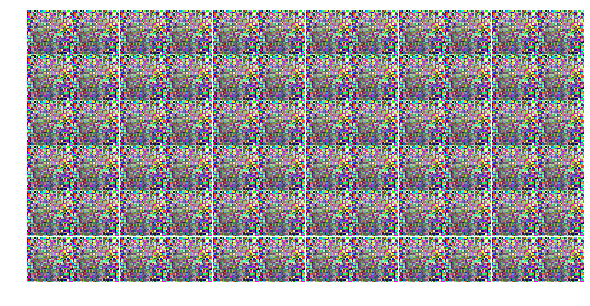

Epoch 8/100... Discriminator Loss: 0.0340... Generator Loss: -3.9273
Epoch 8/100... Discriminator Loss: 0.0159... Generator Loss: -3.7127
Epoch 8/100... Discriminator Loss: 0.0112... Generator Loss: -3.7948
Epoch 8/100... Discriminator Loss: 0.0045... Generator Loss: -3.8833
Epoch 8/100... Discriminator Loss: 0.0311... Generator Loss: -3.7275
Epoch 8/100... Discriminator Loss: 0.0252... Generator Loss: -3.7190
Epoch 8/100... Discriminator Loss: 0.0016... Generator Loss: -3.8782
Epoch 8/100... Discriminator Loss: 0.0412... Generator Loss: -4.0357
Epoch 8/100... Discriminator Loss: 0.0026... Generator Loss: -3.7793
Epoch 8/100... Discriminator Loss: 0.0040... Generator Loss: -3.7788


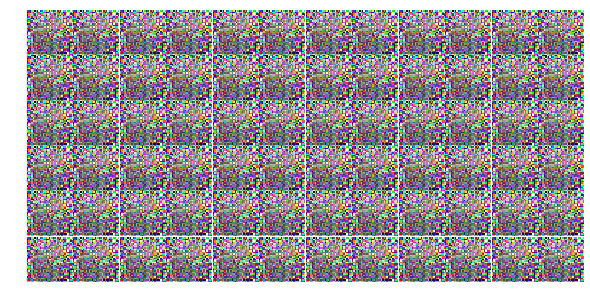

Epoch 8/100... Discriminator Loss: 0.0069... Generator Loss: -3.7289
Epoch 8/100... Discriminator Loss: 0.0140... Generator Loss: -3.7213
Epoch 8/100... Discriminator Loss: 0.0457... Generator Loss: -3.5734
Epoch 8/100... Discriminator Loss: 0.0030... Generator Loss: -3.7888
Epoch 8/100... Discriminator Loss: 0.0109... Generator Loss: -3.7396
Epoch 8/100... Discriminator Loss: 0.0031... Generator Loss: -3.7656
Epoch 8/100... Discriminator Loss: 0.0083... Generator Loss: -3.6969
Epoch 8/100... Discriminator Loss: 0.0147... Generator Loss: -3.7023
Epoch 8/100... Discriminator Loss: 0.0261... Generator Loss: -3.8808
Epoch 8/100... Discriminator Loss: 0.0565... Generator Loss: -3.6450


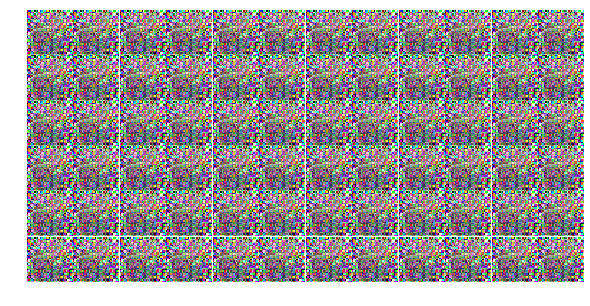

Epoch 8/100... Discriminator Loss: 0.0159... Generator Loss: -3.6638
Epoch 8/100... Discriminator Loss: 0.0045... Generator Loss: -3.6572
Epoch 8/100... Discriminator Loss: 0.0064... Generator Loss: -3.8190
Epoch 8/100... Discriminator Loss: 0.0013... Generator Loss: -3.7572
Epoch 8/100... Discriminator Loss: 0.0393... Generator Loss: -3.4223
Epoch 8/100... Discriminator Loss: 0.0030... Generator Loss: -3.7442
Epoch 8/100... Discriminator Loss: 0.0080... Generator Loss: -3.7286
Epoch 8/100... Discriminator Loss: 0.0034... Generator Loss: -3.7420
Epoch 8/100... Discriminator Loss: 0.0102... Generator Loss: -3.8111
Epoch 8/100... Discriminator Loss: 0.0031... Generator Loss: -3.6069


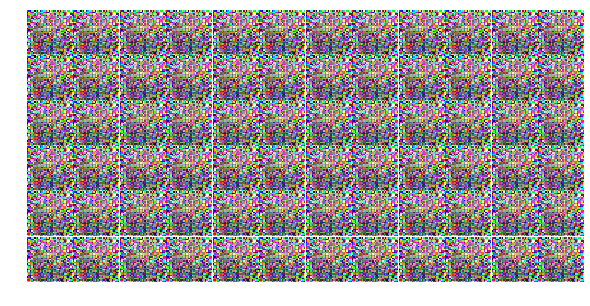

Epoch 8/100... Discriminator Loss: 0.0062... Generator Loss: -3.6088
Epoch 8/100... Discriminator Loss: 0.0156... Generator Loss: -3.6150
Epoch 8/100... Discriminator Loss: 0.0073... Generator Loss: -3.6646
Epoch 8/100... Discriminator Loss: 0.0034... Generator Loss: -3.6477
Epoch 8/100... Discriminator Loss: 0.0031... Generator Loss: -3.6835
Epoch 8/100... Discriminator Loss: 0.0063... Generator Loss: -3.5670
Epoch 8/100... Discriminator Loss: 0.0138... Generator Loss: -3.5537
Epoch 8/100... Discriminator Loss: 0.0101... Generator Loss: -3.6192
Epoch 8/100... Discriminator Loss: 0.0267... Generator Loss: -3.5868
Epoch 8/100... Discriminator Loss: 0.0121... Generator Loss: -3.6308


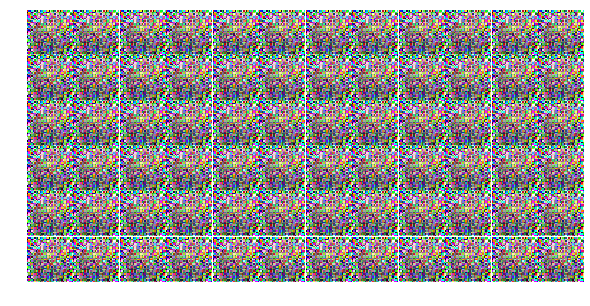

Epoch 8/100... Discriminator Loss: 0.0155... Generator Loss: -3.4972
Epoch 8/100... Discriminator Loss: 0.1107... Generator Loss: -3.8065
Epoch 8/100... Discriminator Loss: 0.0157... Generator Loss: -3.4376
Epoch 8/100... Discriminator Loss: 0.0082... Generator Loss: -3.4526
Epoch 8/100... Discriminator Loss: 0.0042... Generator Loss: -3.4772
Epoch 8/100... Discriminator Loss: 0.0076... Generator Loss: -3.5743
Epoch 8/100... Discriminator Loss: 0.0505... Generator Loss: -3.6346
(128, 100) (41, 32, 32, 3)
Epoch 9/100... Discriminator Loss: 0.0920... Generator Loss: -3.2248
Epoch 9/100... Discriminator Loss: 0.0141... Generator Loss: -3.6149
Epoch 9/100... Discriminator Loss: 0.0014... Generator Loss: -3.5444


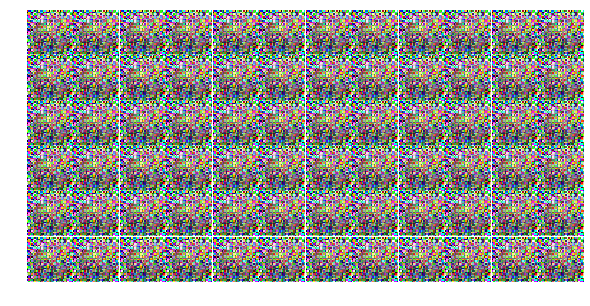

Epoch 9/100... Discriminator Loss: 0.0125... Generator Loss: -3.5652
Epoch 9/100... Discriminator Loss: 0.0298... Generator Loss: -3.6397
Epoch 9/100... Discriminator Loss: 0.0534... Generator Loss: -3.2845
Epoch 9/100... Discriminator Loss: 0.0104... Generator Loss: -3.6255
Epoch 9/100... Discriminator Loss: 0.0042... Generator Loss: -3.5155
Epoch 9/100... Discriminator Loss: 0.0074... Generator Loss: -3.5485
Epoch 9/100... Discriminator Loss: 0.0224... Generator Loss: -3.2975
Epoch 9/100... Discriminator Loss: 0.0132... Generator Loss: -3.6009
Epoch 9/100... Discriminator Loss: 0.0016... Generator Loss: -3.3961
Epoch 9/100... Discriminator Loss: 0.0105... Generator Loss: -3.4444


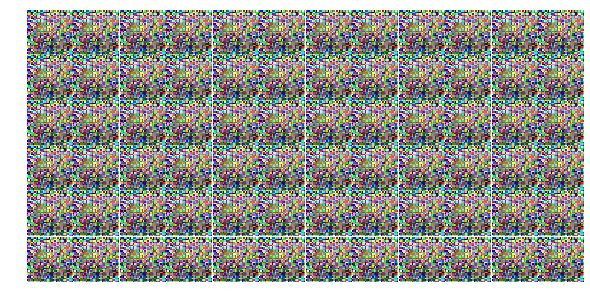

Epoch 9/100... Discriminator Loss: 0.0027... Generator Loss: -3.3196
Epoch 9/100... Discriminator Loss: 0.0205... Generator Loss: -3.2738
Epoch 9/100... Discriminator Loss: 0.0137... Generator Loss: -3.3206
Epoch 9/100... Discriminator Loss: 0.0361... Generator Loss: -3.1956
Epoch 9/100... Discriminator Loss: 0.0150... Generator Loss: -3.4696
Epoch 9/100... Discriminator Loss: 0.0286... Generator Loss: -3.2866
Epoch 9/100... Discriminator Loss: 0.0318... Generator Loss: -3.4153
Epoch 9/100... Discriminator Loss: 0.0042... Generator Loss: -3.3802
Epoch 9/100... Discriminator Loss: 0.0188... Generator Loss: -3.2148
Epoch 9/100... Discriminator Loss: 0.0500... Generator Loss: -3.1354


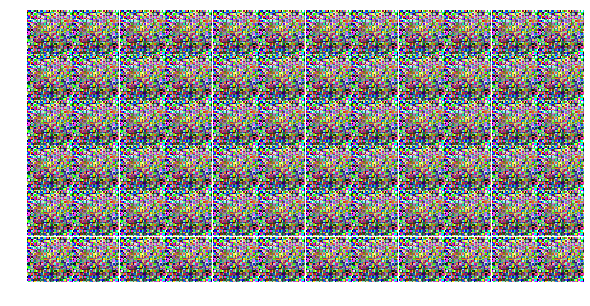

Epoch 9/100... Discriminator Loss: 0.0206... Generator Loss: -3.2638
Epoch 9/100... Discriminator Loss: 0.0619... Generator Loss: -3.5211
Epoch 9/100... Discriminator Loss: 0.0053... Generator Loss: -3.3185
Epoch 9/100... Discriminator Loss: 0.0060... Generator Loss: -3.2764
Epoch 9/100... Discriminator Loss: 0.0073... Generator Loss: -3.3211
Epoch 9/100... Discriminator Loss: 0.0072... Generator Loss: -3.3698
Epoch 9/100... Discriminator Loss: 0.0125... Generator Loss: -3.1340
Epoch 9/100... Discriminator Loss: 0.0029... Generator Loss: -3.3274
Epoch 9/100... Discriminator Loss: 0.0268... Generator Loss: -3.4266
Epoch 9/100... Discriminator Loss: 0.0045... Generator Loss: -3.3576


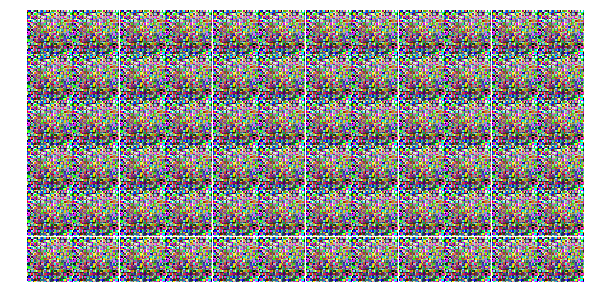

Epoch 9/100... Discriminator Loss: 0.0064... Generator Loss: -3.3060
Epoch 9/100... Discriminator Loss: 0.0242... Generator Loss: -3.1946
Epoch 9/100... Discriminator Loss: 0.0008... Generator Loss: -3.2804
Epoch 9/100... Discriminator Loss: 0.0091... Generator Loss: -3.3790
Epoch 9/100... Discriminator Loss: 0.0088... Generator Loss: -3.2834
Epoch 9/100... Discriminator Loss: 0.0545... Generator Loss: -3.4038
Epoch 9/100... Discriminator Loss: 0.0032... Generator Loss: -3.2804
Epoch 9/100... Discriminator Loss: 0.0028... Generator Loss: -3.2036
Epoch 9/100... Discriminator Loss: 0.0064... Generator Loss: -3.3324
Epoch 9/100... Discriminator Loss: 0.0094... Generator Loss: -3.1546


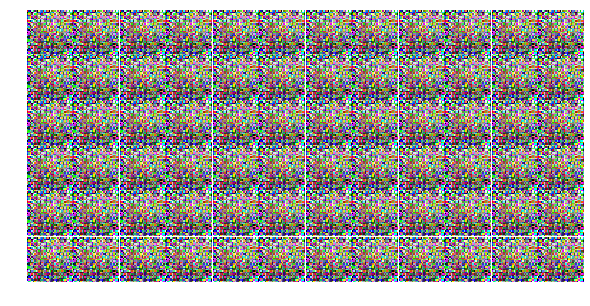

Epoch 9/100... Discriminator Loss: 0.0063... Generator Loss: -3.2610
Epoch 9/100... Discriminator Loss: 0.0035... Generator Loss: -3.1632
Epoch 9/100... Discriminator Loss: 0.0042... Generator Loss: -3.1613
Epoch 9/100... Discriminator Loss: 0.0090... Generator Loss: -3.1615
Epoch 9/100... Discriminator Loss: 0.0088... Generator Loss: -3.2673
Epoch 9/100... Discriminator Loss: 0.0182... Generator Loss: -3.3205
Epoch 9/100... Discriminator Loss: 0.0110... Generator Loss: -3.2148
Epoch 9/100... Discriminator Loss: 0.0194... Generator Loss: -3.3167
Epoch 9/100... Discriminator Loss: 0.0286... Generator Loss: -3.2888
Epoch 9/100... Discriminator Loss: 0.0176... Generator Loss: -3.2002


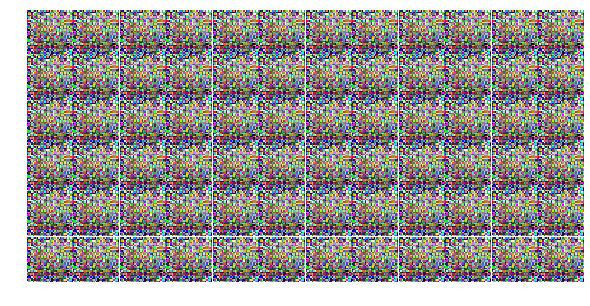

Epoch 9/100... Discriminator Loss: 0.0069... Generator Loss: -3.1538
Epoch 9/100... Discriminator Loss: 0.0096... Generator Loss: -3.2405
Epoch 9/100... Discriminator Loss: 0.0060... Generator Loss: -3.0508
Epoch 9/100... Discriminator Loss: 0.0185... Generator Loss: -3.3464
(128, 100) (41, 32, 32, 3)
Epoch 10/100... Discriminator Loss: 0.0045... Generator Loss: -3.0537
Epoch 10/100... Discriminator Loss: 0.0117... Generator Loss: -3.2135
Epoch 10/100... Discriminator Loss: 0.0212... Generator Loss: -3.0871
Epoch 10/100... Discriminator Loss: 0.0083... Generator Loss: -3.1941
Epoch 10/100... Discriminator Loss: 0.0163... Generator Loss: -3.2626
Epoch 10/100... Discriminator Loss: 0.0462... Generator Loss: -2.9839


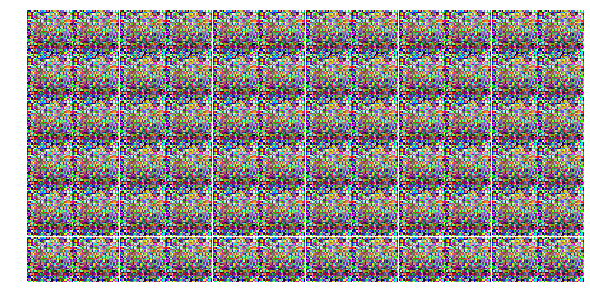

Epoch 10/100... Discriminator Loss: 0.0012... Generator Loss: -3.1597
Epoch 10/100... Discriminator Loss: 0.0125... Generator Loss: -3.1045
Epoch 10/100... Discriminator Loss: 0.0266... Generator Loss: -2.9337
Epoch 10/100... Discriminator Loss: 0.0056... Generator Loss: -3.0328
Epoch 10/100... Discriminator Loss: 0.0059... Generator Loss: -3.0697
Epoch 10/100... Discriminator Loss: 0.0038... Generator Loss: -3.0316
Epoch 10/100... Discriminator Loss: 0.0048... Generator Loss: -3.1093
Epoch 10/100... Discriminator Loss: 0.0022... Generator Loss: -3.0614
Epoch 10/100... Discriminator Loss: 0.0272... Generator Loss: -2.9196
Epoch 10/100... Discriminator Loss: 0.0163... Generator Loss: -3.0849


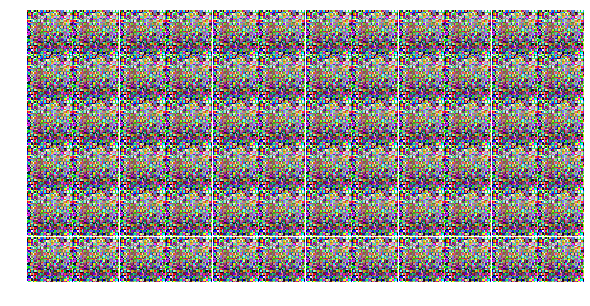

Epoch 10/100... Discriminator Loss: 0.0040... Generator Loss: -2.9666
Epoch 10/100... Discriminator Loss: 0.0066... Generator Loss: -3.1081
Epoch 10/100... Discriminator Loss: 0.0104... Generator Loss: -2.9461
Epoch 10/100... Discriminator Loss: 0.0324... Generator Loss: -3.1860
Epoch 10/100... Discriminator Loss: 0.0015... Generator Loss: -2.9760
Epoch 10/100... Discriminator Loss: 0.0115... Generator Loss: -2.9869
Epoch 10/100... Discriminator Loss: 0.0195... Generator Loss: -2.8573
Epoch 10/100... Discriminator Loss: 0.0163... Generator Loss: -2.8171
Epoch 10/100... Discriminator Loss: 0.0593... Generator Loss: -3.1746
Epoch 10/100... Discriminator Loss: 0.0141... Generator Loss: -2.8512


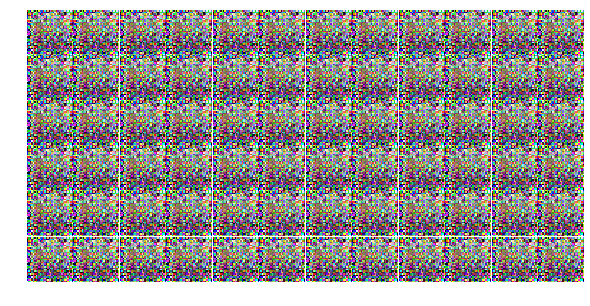

Epoch 10/100... Discriminator Loss: 0.0015... Generator Loss: -2.9020
Epoch 10/100... Discriminator Loss: 0.0067... Generator Loss: -3.0354
Epoch 10/100... Discriminator Loss: 0.0206... Generator Loss: -2.9648
Epoch 10/100... Discriminator Loss: 0.0081... Generator Loss: -2.8618
Epoch 10/100... Discriminator Loss: 0.0049... Generator Loss: -2.9316
Epoch 10/100... Discriminator Loss: 0.0077... Generator Loss: -2.9817
Epoch 10/100... Discriminator Loss: 0.0044... Generator Loss: -2.9133


In [ ]:
losses, samples = train(net=net, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

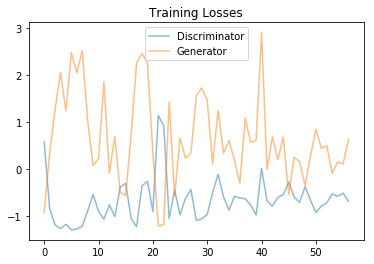

In [22]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

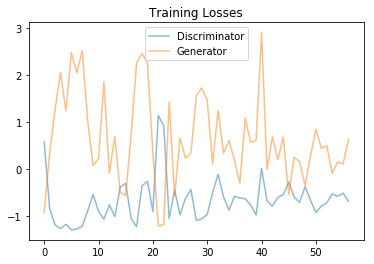

In [23]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


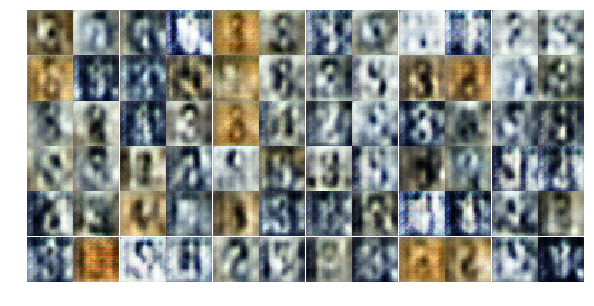

In [24]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

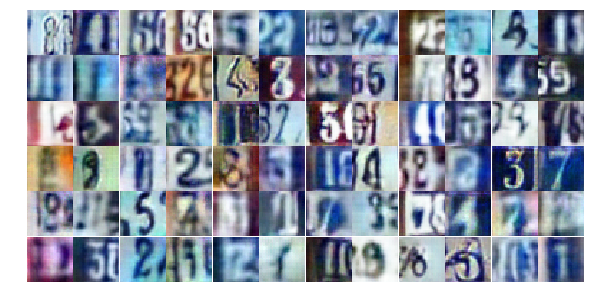

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))